In [1]:
from ir_tools import readwav, writewav, display_audio, crop, limit, deconvolve

# Define filenames
SWEEPFILE = 'sweep-44.wav'
RECFILE   = 'rec-44-stereo.wav'
OUTFILE   = 'ir-44-stereo.wav'

LIMIT     = 'normalize' # Other options: 'clip' or None
THRESHOLD = 0.001 # Remove samples at start/end below threshold 

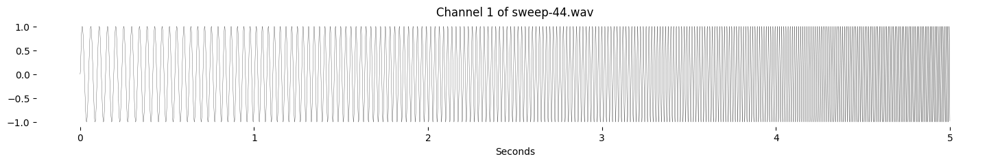

In [ ]:
# Load original sine sweep
samplerate, sweep = readwav(SWEEPFILE)
for i, data in enumerate(sweep):
    display_audio(data, samplerate, 'black', f'Channel {i+1} of {SWEEPFILE}', 5)

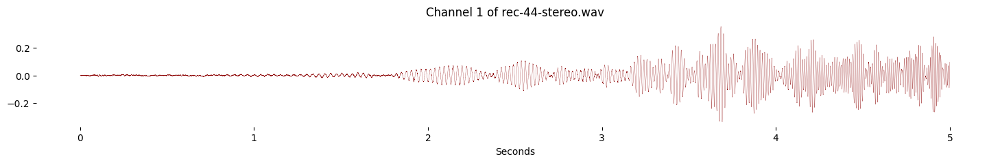

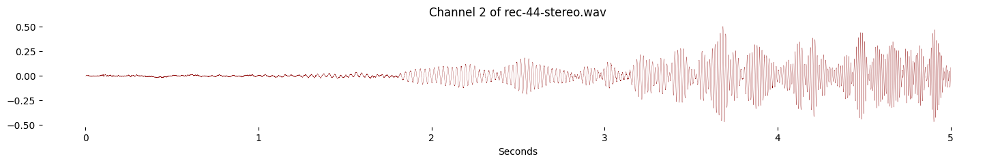

In [3]:
# Load (multichannel) recorded sine sweep
_, recording = readwav(RECFILE)
for i, data in enumerate(recording):
    display_audio(data, samplerate, 'darkred', f'Channel {i+1} of {RECFILE}', 5)

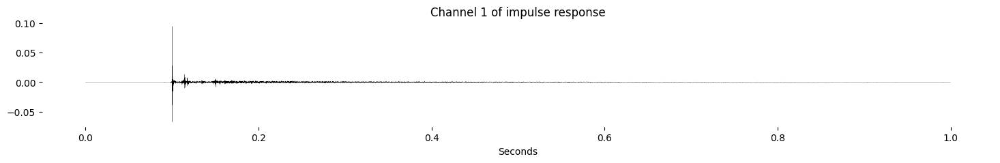

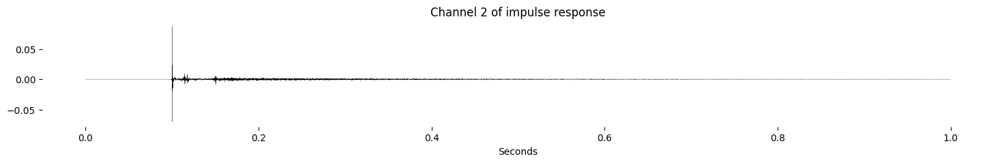

2-channel audio written to "ir-44-stereo.wav"


In [5]:
# Create (multichannel) impulse response by deconvolving recorded sine sweeps with original sine sweep
impulse_responses = []
for i, data in enumerate(recording):
    ir = deconvolve(sweep[0], data, samplerate)
    impulse_responses.append(ir)
    display_audio(ir, samplerate, 'black', f'Channel {i+1} of impulse response', 1)
wave = crop(limit(impulse_responses, LIMIT), THRESHOLD)
writewav(OUTFILE, wave, samplerate)